# Create LightGBM model based on a set of historical features

### Genrate features

In [65]:
import pandas as pd
import numpy as np
from typing import List

def calculate_rsi(prices: pd.Series, window: int = 14) -> pd.Series:
    delta = prices.diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    return 100 - (100 / (1 + rs))

def calculate_macd(prices: pd.Series, fast: int = 12, slow: int = 26, signal: int = 9) -> pd.Series:
    exp1 = prices.ewm(span=fast, adjust=False).mean()
    exp2 = prices.ewm(span=slow, adjust=False).mean()
    macd = exp1 - exp2
    signal_line = macd.ewm(span=signal, adjust=False).mean()
    return macd - signal_line

def create_features(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    
    # Lagged values
    for lag in [1, 2, 3, 5, 7, 14, 21]:
        df[f'close_lag_{lag}'] = df['Close'].shift(lag)
    
    # Percentage changes
    # shift 1 to avoid look-ahead bias anfd prevent data leakage
    for period in [1, 3, 5, 7, 14, 21]:
        df[f'close_pct_change_{period}'] = df['Close'].pct_change(period).shift(1)
    
    # Rolling statistics
    for window in [7, 14, 30]:
        df[f'close_rolling_mean_{window}'] = df['Close'].rolling(window=window).mean().shift(1)
        df[f'close_rolling_std_{window}'] = df['Close'].rolling(window=window).std().shift(1)
    
    # RSI
    df['RSI'] = calculate_rsi(df['Close']).shift(1)
    
    # MACD
    df['MACD'] = calculate_macd(df['Close']).shift(1)
    
    # Bollinger Bands
    df['BB_middle'] = df['Close'].rolling(window=20).mean().shift(1)
    df['BB_upper'] = (df['BB_middle'] + 2 * df['Close'].rolling(window=20).std()).shift(1)
    df['BB_lower'] = (df['BB_middle'] - 2 * df['Close'].rolling(window=20).std()).shift(1)
    df['BB_width'] = ((df['BB_upper'] - df['BB_lower']) / df['BB_middle']).shift(1)

    # New calendar features
    df['day_of_week'] = df.index.dayofweek
    df['day_of_month'] = df.index.day
    df['week_of_year'] = df.index.isocalendar().week
    df['month'] = df.index.month
    df['quarter'] = df.index.quarter
    df['year'] = df.index.year
    df['is_month_start'] = df.index.is_month_start.astype(int)
    df['is_month_end'] = df.index.is_month_end.astype(int)
    
    # Remove rows with NaN values
    df = df.dropna()
    
    return df

# Load the data
df = pd.read_csv('../data/TSLA.csv', index_col='Unnamed: 0', parse_dates=True)
df=df[['Close']]
# Create features
df_with_features = create_features(df)

# Define the feature columns
feature_columns = [col for col in df_with_features.columns if col != 'Close']

# Validation
print("Original dataframe shape:", df.shape)
print("Dataframe with features shape:", df_with_features.shape)
print("Number of features created:", len(feature_columns))
print("\nFirst few rows of the dataframe with features:")
print(df_with_features.head())
print("\nFeature columns:")
print(feature_columns)

Original dataframe shape: (499, 1)
Dataframe with features shape: (469, 34)
Number of features created: 33

First few rows of the dataframe with features:
                 Close  close_lag_1  close_lag_2  close_lag_3  close_lag_5  \
2022-09-14  302.609985   292.130005   304.420013   299.679993   283.700012   
2022-09-15  303.750000   302.609985   292.130005   304.420013   289.260010   
2022-09-16  303.350006   303.750000   302.609985   292.130005   299.679993   
2022-09-19  309.070007   303.350006   303.750000   302.609985   304.420013   
2022-09-20  308.730011   309.070007   303.350006   303.750000   292.130005   

            close_lag_7  close_lag_14  close_lag_21  close_pct_change_1  \
2022-09-14   270.209991    297.096680    309.320007           -0.040372   
2022-09-15   274.420013    296.070007    306.563324            0.035874   
2022-09-16   283.700012    288.089996    303.996674            0.003767   
2022-09-19   289.260010    284.820007    302.869995           -0.001317   
2

## Autoregressive approach

### Befine the best hyper parameters for the model

In [66]:
import pandas as pd
import numpy as np
from lightgbm import LGBMRegressor
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from typing import List, Dict
from itertools import product
from lightgbm import early_stopping

# Suppress warnings
import warnings
warnings.filterwarnings("ignore", category=UserWarning, message="No further splits with positive gain")

# Or more specifically for LightGBM:
import lightgbm as lgb
lgb.log_evaluation(period=0)  # This will suppress LightGBM warnings



def prepare_data_for_training(df: pd.DataFrame, target_column: str, feature_columns: List[str], day_forecast=0) -> pd.DataFrame:
    df = df.copy()
    df['target'] = df[target_column].shift(day_forecast)  # Shift by 1 day
    return df[feature_columns + ['target']].dropna()

def scale_data(train_data: pd.DataFrame, test_data: pd.DataFrame, feature_columns: List[str], target_column: str):
    feature_scaler = StandardScaler()
    target_scaler = StandardScaler()
    
    train_features_scaled = feature_scaler.fit_transform(train_data[feature_columns])
    train_target_scaled = target_scaler.fit_transform(train_data[[target_column]])
    
    test_features_scaled = feature_scaler.transform(test_data[feature_columns])
    test_target_scaled = target_scaler.transform(test_data[[target_column]])
    
    return (train_features_scaled, train_target_scaled.ravel(), 
            test_features_scaled, test_target_scaled.ravel(), 
            feature_scaler, target_scaler)

def update_features(df: pd.DataFrame, new_value: float) -> pd.DataFrame:
    df_ = df.copy()
    new_ind=(df_.index[-1] + pd.Timedelta(days=1))
    df_.loc[new_ind] = new_value
    # Update lagged values
    for lag in [1, 2, 3, 5, 7, 14, 21]:
        df[f'close_lag_{lag}'] = df['Close'].shift(lag)
    
    # Update percentage changes
    for period in [1, 3, 5, 7, 14, 21]:
        df[f'close_pct_change_{period}'] = df['Close'].pct_change(period).shift(1)
    
    # Update rolling statistics
    for window in [7, 14, 30]:
        df[f'close_rolling_mean_{window}'] = df['Close'].rolling(window=window).mean().shift(1) 
        df[f'close_rolling_std_{window}'] = df['Close'].rolling(window=window).std().shift(1)
    
    # Update RSI
    delta = df['Close'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
    rs = gain / loss
    df['RSI'] = 100 - (100 / (1 + rs))
    df['RSI'] = df['RSI'].shift(1)
    
    # Update MACD
    exp1 = df['Close'].ewm(span=12, adjust=False).mean()
    exp2 = df['Close'].ewm(span=26, adjust=False).mean()
    macd = exp1 - exp2
    signal = macd.ewm(span=9, adjust=False).mean()
    df['MACD'] = macd - signal
    df['MACD'] = df['MACD'].shift(1)
    
    # Update Bollinger Bands
    df['BB_middle'] = df['Close'].rolling(window=20).mean().shift(1)
    df['BB_upper'] = (df['BB_middle'] + 2 * df['Close'].rolling(window=20).std()).shift(1)
    df['BB_lower'] = (df['BB_middle'] - 2 * df['Close'].rolling(window=20).std()).shift(1)
    df['BB_width'] = ((df['BB_upper'] - df['BB_lower']) / df['BB_middle']).shift(1)
    # Add calendar features
    df['day_of_week'] = df.index.dayofweek
    df['day_of_month'] = df.index.day
    df['week_of_year'] = df.index.isocalendar().week
    df['month'] = df.index.month
    df['quarter'] = df.index.quarter
    df['year'] = df.index.year
    df['is_month_start'] = df.index.is_month_start.astype(int)
    df['is_month_end'] = df.index.is_month_end.astype(int)
    return df.iloc[[-1]]  # Return only the last row with updated features

def evaluate_model(model, X: np.ndarray, y: np.ndarray, feature_scaler: StandardScaler, target_scaler: StandardScaler, forecast_horizon: int, df: pd.DataFrame, feature_columns: List[str]) -> float:
    predictions = []
    last_known_prices = df['Close'].iloc[-len(X):]
    current_features = df[feature_columns].iloc[-len(X):]
    
    for i in range(forecast_horizon):
        # Scale the current features
        X_scaled = feature_scaler.transform(current_features.iloc[[-1]])
        
        # Make prediction
        pred_scaled = model.predict(X_scaled)
        pred = target_scaler.inverse_transform(pred_scaled.reshape(-1, 1))[0][0]
        predictions.append(pred)
        
        # Update features for the next prediction
        updated_df = update_features(last_known_prices.to_frame(), pred)
        current_features = updated_df[feature_columns]
        last_known_prices.loc[(last_known_prices.index[-1] + pd.Timedelta(days=1))] = pred
    y_true = target_scaler.inverse_transform(y[:forecast_horizon].reshape(-1, 1)).ravel()
    return np.sqrt(mean_squared_error(y_true, predictions))

def find_best_parameters(df: pd.DataFrame, feature_columns: List[str], target_column: str, forecast_horizon: int = 30) -> Dict:
    data = prepare_data_for_training(df, target_column, feature_columns)
    
    param_grid = {
        'n_estimators': [200],
        'learning_rate': [0.01,  0.05],
        'max_depth': [ 3,5],
        'num_leaves': [7,31],
        'min_child_samples': [20, 50]
    }
    
    tscv = TimeSeriesSplit(n_splits=10, test_size=forecast_horizon)
    
    best_score = float('inf')
    best_params = None
    
    for params in product(*param_grid.values()):
        current_params = dict(zip(param_grid.keys(), params))
        model = LGBMRegressor(**current_params, random_state=42, verbosity=-1)
        
        scores = []
        for train_index, test_index in tscv.split(data):
            train_data = data.iloc[train_index]
            test_data = data.iloc[test_index]
            
            if len(train_data) < 90:  # Ensure at least 90 days of training data
                continue
            
            X_train, y_train, X_test, y_test, feature_scaler, target_scaler = scale_data(
                train_data, test_data, feature_columns, 'target')
            
            #model.fit(X_train, y_train)
            model.fit(
            X_train, y_train,
            eval_set=[(X_test, y_test)],
            callbacks=[early_stopping(stopping_rounds=10)]
        )
            score = evaluate_model(model, X_test, y_test, feature_scaler, target_scaler, forecast_horizon, df.iloc[train_index], feature_columns)
            scores.append(score)
        
        avg_score = np.mean(scores)
        if avg_score < best_score:
            best_score = avg_score
            best_params = current_params
        
        print(f"Params: {current_params}, Average RMSE: {avg_score}")
    
    print(f"\nBest parameters: {best_params}")
    print(f"Best average RMSE: {best_score}")
    return best_params

# Load and prepare data
df = pd.read_csv('../data/TSLA.csv', index_col='Unnamed: 0', parse_dates=True)
df=df[['Close']]
df_with_features = create_features(df)

# Define feature columns (excluding 'Close' and 'target')
feature_columns = [col for col in df_with_features.columns if col not in ['Close', 'target']]

# Find best parameters
best_params = find_best_parameters(df_with_features, feature_columns, 'Close', forecast_horizon=30)

# Validation
print("\nValidation:")
print("Number of features used:", len(feature_columns))
print("Feature columns:", feature_columns)

Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.37023
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.10198
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.059381
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[191]	valid_0's l2: 0.0291164
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0219161
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[198]	valid_0's l2: 0.0257921
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0266927
Training until validation scores

### Create forecast


Forecast for the last 30 days:
                 Close
2024-06-14  220.015381
2024-06-17  221.620055
2024-06-18  220.072216
2024-06-19  222.860071
2024-06-20  223.628477
2024-06-21  225.561562
2024-06-24  229.549986
2024-06-25  227.305903
2024-06-26  233.086605
2024-06-27  227.673888
2024-06-28  233.696283
2024-07-01  226.499349
2024-07-02  231.182811
2024-07-03  226.669424
2024-07-04  231.998433
2024-07-05  223.943189
2024-07-08  232.659150
2024-07-09  223.103077
2024-07-10  230.859314
2024-07-11  222.896423
2024-07-12  231.564814
2024-07-15  219.651183
2024-07-16  232.239616
2024-07-17  212.761640
2024-07-18  231.090407
2024-07-19  209.251864
2024-07-22  229.776945
2024-07-23  211.723217
2024-07-24  229.514390
2024-07-25  212.137400

RMSE: 30.31244012897533


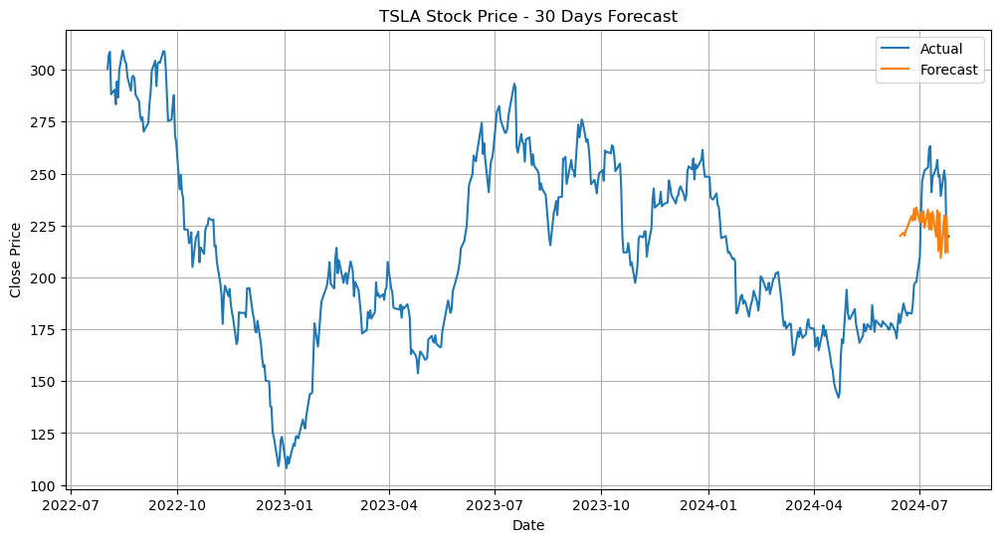

In [67]:
import pandas as pd
import numpy as np
from lightgbm import LGBMRegressor
from sklearn.preprocessing import StandardScaler
from typing import List
#def prepare_data_for_training(df: pd.DataFrame, target_column: str, feature_columns: List[str]) -> pd.DataFrame:
#    df = df.copy()
#    df['target'] = df[target_column]  # Shift by 1 day
#    return df[feature_columns + ['target']].dropna()

def forecast_last_N_days(df: pd.DataFrame, feature_columns: List[str], best_params: Dict, forecast_horizon: int = 7):
    # Prepare the data
    data = prepare_data_for_training(df, 'Close', feature_columns)
    # Split the data
    train_data = data.iloc[:-forecast_horizon]
    test_data = data.iloc[-forecast_horizon:]
    
    # Scale the data
    X_train, y_train, X_test, y_test, feature_scaler, target_scaler = scale_data(
        train_data, test_data, feature_columns, 'target')
    
    # Create and train the model
    model = LGBMRegressor(**best_params, random_state=42, verbosity=-1)
    model.fit(X_train, y_train)
    
    # Make predictions
    predictions = []
    last_known_prices = df['Close'].iloc[-len(X_test):]
    current_features = df[feature_columns].iloc[-len(X_test):]
    
    for i in range(forecast_horizon):
        # Scale the current features
        X_scaled = feature_scaler.transform(current_features.iloc[[-1]])
        
        # Make prediction
        pred_scaled = model.predict(X_scaled)
        pred = target_scaler.inverse_transform(pred_scaled.reshape(-1, 1))[0][0]
        predictions.append(pred)
        
        # Update features for the next prediction
        last_known_prices.loc[(last_known_prices.index[-1] + pd.Timedelta(days=1))] = pred
        updated_df = update_features(last_known_prices.to_frame(), pred)
        current_features = updated_df[feature_columns]
        
    
    # Create a DataFrame with the predictions
    forecast_dates = pd.date_range(start=df.index[-forecast_horizon] + pd.Timedelta(days=1), periods=forecast_horizon, freq='B')
    forecast_df = pd.DataFrame({'Close': predictions}, index=forecast_dates)
    
    # Calculate RMSE
    y_true = df['Close'].iloc[-forecast_horizon:].values
    rmse = np.sqrt(mean_squared_error(y_true, predictions))
    
    return forecast_df, rmse
days_forecast=30
# Use the function
forecast_df, rmse = forecast_last_N_days(df_with_features, feature_columns, best_params, forecast_horizon=days_forecast)

print(f"\nForecast for the last {days_forecast} days:")
print(forecast_df)
print(f"\nRMSE: {rmse}")

# Plot the results
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
#plt.plot(df.index[-30:], df['Close'].iloc[-30:], label='Actual')
plt.plot(df.index, df['Close'], label='Actual')
plt.plot(forecast_df.index, forecast_df['Close'], label='Forecast')
plt.title(f'TSLA Stock Price - {days_forecast} Days Forecast')
plt.xlabel('Date')
plt.ylabel('Close Price')
plt.legend()
plt.grid(True)
plt.show()

## Create several forecast models for each step of the forecast horizon


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00093227
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00249308
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_p

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0088992
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00093227
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pc

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00942949
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_roll

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00612154
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_roll

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0434458
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00074913
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'cl

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00612154
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0088992
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'cl

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0405164
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0434458
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'clo

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0129222
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[108]	valid_0's l2: 3.22283e-07
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5',

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0434458
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00074913
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'cl

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0128709
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00275207
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'cl

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0128709
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00275207
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'cl

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0128709
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00275207
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'cl

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[197]	valid_0's l2: 3.27531e-08
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0195019
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'c

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[199]	valid_0's l2: 0.0489853
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0202091
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[197]	valid_0's l2: 3.27531e-08
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0195019
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'c

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0331459
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0523179
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0331459
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0523179
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'clo

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00499852
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[199]	valid_0's l2: 0.0654199
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'cl

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[199]	valid_0's l2: 9.2361e-05
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00499852
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_p

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00499852
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[199]	valid_0's l2: 0.0654199
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'cl

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[199]	valid_0's l2: 0.04267
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00651361
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[199]	valid_0's l2: 9.2361e-05
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00499852
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'c

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[199]	valid_0's l2: 9.2361e-05
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_roll

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[199]	valid_0's l2: 0.04267
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00651361
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'clos

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0624569
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[199]	valid_0's l2: 0.04267
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Early stopping, best iteration is:
[188]	valid_0's l2: 2.00426e-09
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0283386
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_chan

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[144]	valid_0's l2: 5.36681e-08
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[188]	valid_0's l2: 2.00426e-09
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.134915
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0671099
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'clos

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0726702
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.134915
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0883904
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0726702
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/var/folders/0n/zbn05tys7vxf2qmpt5ky41h80000gq/T/ipykernel_28140/3403419996.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data['Forecast']=model_test_predictions


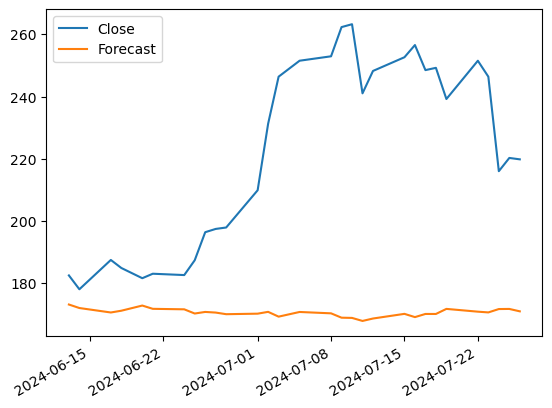

In [68]:
## Create several LightGBM models for each future day to forecast
forecast_horizon=30
# Prepare the data
train_data= df_with_features.iloc[:-forecast_horizon]
test_data = df_with_features.iloc[-forecast_horizon:]

feature_scaler = StandardScaler()
target_scaler = StandardScaler()
feature_columns = [col for col in df_with_features.columns if col not in ['Close', 'target']]
target_column='Close'
train_features_scaled = feature_scaler.fit_transform(train_data[feature_columns])
train_target_scaled = target_scaler.fit_transform(train_data[[target_column]])

pred_models={}
for i in range(forecast_horizon):
        df_with_features_mod = train_data.copy()
        df_with_features_mod['target'] = df_with_features_mod['Close'].shift(-i)  # Shift by a forecasted day
        df_with_features_mod=df_with_features_mod.dropna()
        train_features_scaled_mod = feature_scaler.transform(df_with_features_mod[feature_columns])
        train_target_scaled_mod = target_scaler.transform(df_with_features_mod[[target_column]])
        #best_params = find_best_parameters(df_with_features_mod, feature_columns, 'Close', forecast_horizon=1)
        best_params = find_best_parameters_stat(df_with_features_mod, feature_columns, 'Close', forecast_horizon=1)
        # Create and train the model
        model = LGBMRegressor(**best_params, random_state=42, verbosity=-1)
        model.fit(train_features_scaled_mod, train_target_scaled_mod)
        pred_models[f'model_{i}']=model
last_train_day_features=train_data[feature_columns].iloc[-1]

model_test_predictions=[]
for i in range(forecast_horizon):
        model=pred_models[f'model_{i}']
        last_train_day_features_scaled = feature_scaler.transform(last_train_day_features.to_frame().T)
        pred_scaled = model.predict(last_train_day_features_scaled)
        pred = target_scaler.inverse_transform(pred_scaled.reshape(-1, 1))[0][0]
        model_test_predictions.append(pred)
        print(f"Forecast for day {i+1}: {pred}")
        #last_train_day_features=update_features(last_train_day_features.to_frame(), pred)
#predictions=model.predict(X_test)
#predictions=target_scaler.inverse_transform(predictions.reshape(-1, 1)).ravel()
test_data['Forecast']=model_test_predictions
test_data[['Close', 'Forecast']].plot()
#test_data['Close'].plot(label='Actual')
#plt.plot(test_data.index, model_test_predictions, label='Forecast')
plt.legend()
plt.show()

In [71]:
#calculate the RMSE, MAPE, MAE between the actual and forecasted values
from sklearn.metrics import mean_squared_error, mean_absolute_error
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    mae = mean_absolute_error(y_true, y_pred)
    return rmse, mape, mae

rmse, mape, mae = calculate_metrics(test_data['Close'], test_data['Forecast'])
print(f"RMSE: {rmse}")
print(f"MAPE: {mape:.2f}%")
print(f"MAE: {mae}")


RMSE: 59.91816143975107
MAPE: 21.77%
MAE: 51.6572387498815


In [72]:
# Understand the most important features from built models

import pandas as pd
import numpy as np
from lightgbm import LGBMRegressor
import matplotlib.pyplot as plt

def get_feature_importance(model: LGBMRegressor, feature_names: List[str], top_n: int = 20):
    # Get feature importances
    importances = model.feature_importances_
    # Create a dataframe of feature importances
    feature_importance_df = pd.DataFrame({
        'feature': feature_names,
        'importance': importances
    })
    
    # Sort by importance
    feature_importance_df = feature_importance_df.sort_values('importance', ascending=False).reset_index(drop=True)
    
    # Select top N features
    top_features = feature_importance_df.head(top_n)
    
    return top_features

def plot_feature_importance(top_features: pd.DataFrame, title: str = "Top Feature Importances"):
    plt.figure(figsize=(10, 8))
    plt.barh(top_features['feature'], top_features['importance'])
    plt.title(title)
    plt.xlabel('Importance')
    plt.ylabel('Feature')
    plt.gca().invert_yaxis()  # Invert y-axis to show most important at the top
    plt.tight_layout()
    plt.show()

# Assuming you have already trained your model
# model = LGBMRegressor(**best_params)
# model.fit(X_train, y_train)
#model=pred_models[f'model_2']
# Get feature importances
#top_features = get_feature_importance(model, feature_columns)

#print("Top 20 most important features:")
#print(top_features)

# Plot feature importances
#plot_feature_importance(top_features)

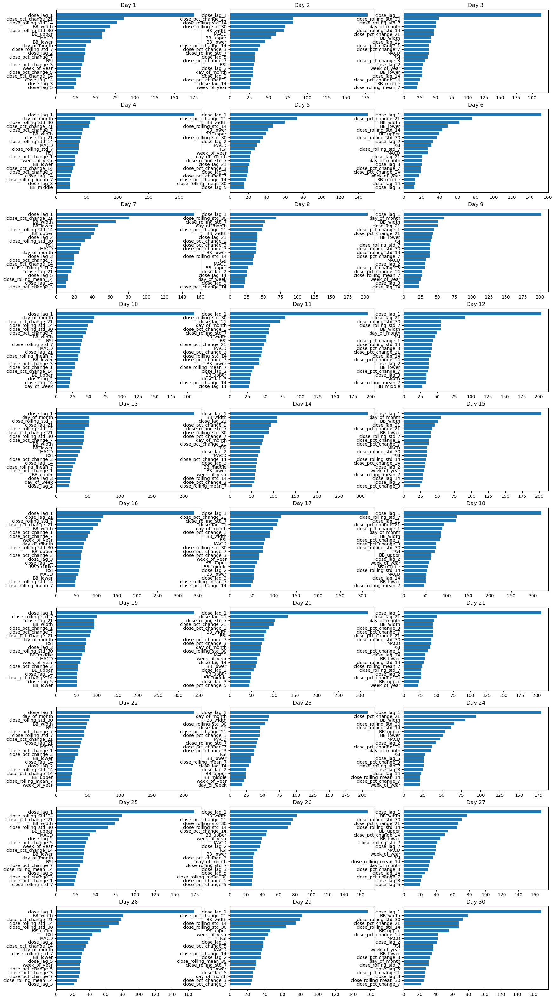

In [73]:
#Plotting the feature importances for all the models in pred_models in 
# grid
fig, axs = plt.subplots(10, 3, figsize=(20, 40))
axs = axs.ravel()
for i in range(len(pred_models)):
    model=pred_models[f'model_{i}']
    top_features = get_feature_importance(model, feature_columns)
    axs[i].barh(top_features['feature'], top_features['importance'])
    axs[i].set_title(f"Day {i+1}")
    axs[i].invert_yaxis()

## Add new market features to predict the future stock price like the S&P 500 index, the VIX volatility index, and the 10-year Treasury yield

In [74]:
import pandas as pd
import numpy as np
import yfinance as yf
from typing import List

def get_market_data(start_date, end_date):
    # Fetch data for S&P 500, VIX, and 10-year Treasury yield
    sp500 = yf.download('^GSPC', start=start_date, end=end_date)['Close']
    vix = yf.download('^VIX', start=start_date, end=end_date)['Close']
    treasury = yf.download('^TNX', start=start_date, end=end_date)['Close']
    
    market_data = pd.DataFrame({
        'SP500': sp500,
        'VIX': vix,
        'Treasury_10Y': treasury
    })
    return market_data

def create_features_extra(df: pd.DataFrame, market_data: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    
    # Merge market data with the main dataframe
    df = df.join(market_data, how='left')
    
    # Existing features
    for lag in [1, 2, 3, 5, 7, 14, 21]:
        df[f'close_lag_{lag}'] = df['Close'].shift(lag)
    
    for period in [1, 3, 5, 7, 14, 21]:
        df[f'close_pct_change_{period}'] = df['Close'].pct_change(period).shift(1)
    
    for window in [7, 14, 30]:
        df[f'close_rolling_mean_{window}'] = df['Close'].rolling(window=window).mean().shift(1)
        df[f'close_rolling_std_{window}'] = df['Close'].rolling(window=window).std().shift(1)
    
    df['RSI'] = calculate_rsi(df['Close']).shift(1)
    df['MACD'] = calculate_macd(df['Close']).shift(1)
    
    df['BB_middle'] = df['Close'].rolling(window=20).mean().shift(1)
    df['BB_upper'] = (df['BB_middle'] + 2 * df['Close'].rolling(window=20).std()).shift(1)
    df['BB_lower'] = (df['BB_middle'] - 2 * df['Close'].rolling(window=20).std()).shift(1)
    df['BB_width'] = ((df['BB_upper'] - df['BB_lower']) / df['BB_middle']).shift(1)

    # Calendar features
    df['day_of_week'] = df.index.dayofweek
    df['day_of_month'] = df.index.day
    df['week_of_year'] = df.index.isocalendar().week
    df['month'] = df.index.month
    df['quarter'] = df.index.quarter
    df['year'] = df.index.year
    df['is_month_start'] = df.index.is_month_start.astype(int)
    df['is_month_end'] = df.index.is_month_end.astype(int)
    
    # New market features
    for column in ['SP500', 'VIX', 'Treasury_10Y']:
        df[f'{column}_pct_change'] = df[column].pct_change().shift(1)
        df[f'{column}_rolling_mean_7'] = df[column].rolling(window=7).mean().shift(1)
        df[f'{column}_rolling_std_7'] = df[column].rolling(window=7).std().shift(1)
    
    # Calculate correlations
    df['TSLA_SP500_corr'] = df['Close'].rolling(window=30).corr(df['SP500']).shift(1)
    df['TSLA_VIX_corr'] = df['Close'].rolling(window=30).corr(df['VIX']).shift(1)
    
    # Remove rows with NaN values
    df = df.dropna()
    
    return df

# Load the data
df = pd.read_csv('../data/TSLA.csv', index_col='Unnamed: 0', parse_dates=True)
df = df[['Close']]

# Get market data
start_date = df.index[0]
end_date = df.index[-1]
market_data = get_market_data(start_date, end_date)

# Create features
df_with_features_extra = create_features_extra(df, market_data)

# Define the feature columns
feature_columns_extra = [col for col in df_with_features_extra.columns if col not in ['Close'] + list(market_data.columns)]

# Validation
print("Original dataframe shape:", df.shape)
print("Dataframe with features shape:", df_with_features_extra.shape)
print("Number of features created:", len(feature_columns_extra))
print("\nFirst few rows of the dataframe with features:")
print(df_with_features_extra.head())
print("\nFeature columns:")
print(feature_columns_extra)

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed


Original dataframe shape: (499, 1)
Dataframe with features shape: (468, 48)
Number of features created: 44

First few rows of the dataframe with features:
                 Close        SP500        VIX  Treasury_10Y  close_lag_1  \
2022-09-14  302.609985  3946.010010  26.160000         3.412   292.130005   
2022-09-15  303.750000  3901.350098  26.270000         3.459   302.609985   
2022-09-16  303.350006  3873.330078  26.299999         3.448   303.750000   
2022-09-19  309.070007  3899.889893  25.760000         3.490   303.350006   
2022-09-20  308.730011  3855.929932  27.160000         3.571   309.070007   

            close_lag_2  close_lag_3  close_lag_5  close_lag_7  close_lag_14  \
2022-09-14   304.420013   299.679993   283.700012   270.209991    297.096680   
2022-09-15   292.130005   304.420013   289.260010   274.420013    296.070007   
2022-09-16   302.609985   292.130005   299.679993   283.700012    288.089996   
2022-09-19   303.750000   302.609985   304.420013   289.260010

/var/folders/0n/zbn05tys7vxf2qmpt5ky41h80000gq/T/ipykernel_28140/821001929.py:56: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df[f'{column}_pct_change'] = df[column].pct_change().shift(1)
/var/folders/0n/zbn05tys7vxf2qmpt5ky41h80000gq/T/ipykernel_28140/821001929.py:56: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df[f'{column}_pct_change'] = df[column].pct_change().shift(1)
/var/folders/0n/zbn05tys7vxf2qmpt5ky41h80000gq/T/ipykernel_28140/821001929.py:56: FutureWarning: The default fill_method='pad' in Series.pct_change is deprecated and will be removed in a future version. Either fill in any 

Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00902675
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve f

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0062612
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.000936974
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve 

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.000936974
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.030691
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.030691
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[2

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Early stopping, best iteration is:
[108]	valid_0's l2: 2.11574e-08
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00271283
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:


/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0130072
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve fo

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00271283
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve f

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0130072
['close_lag_1', 'close_lag_2', 'close_lag_3', 'cl

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Early stopping, best iteration is:
[190]	valid_0's l2: 2.22598e-09
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0167772
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve fo

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0167772
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[190]	valid_0'

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0244204
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve fo

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0244204
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00263528
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve f

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0244204
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve fo

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00555187
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:


/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00555187
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:


/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0734067
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.00555187
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:


/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0734067
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Early stopping, best iteration is:
[182]	valid_0's l2: 4.05371e-07
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.047383
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[51]	valid_0's 

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Early stopping, best iteration is:
[138]	valid_0's l2: 2.4837e-09
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[182]	valid_0's l2: 4.0537

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[138]	valid_0's l2: 2.4837e-09
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds


/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.102081
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.0438935
['close_lag_1', 'close_lag_2', 'close_lag_3', 'cl

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Did not meet early stopping. Best iteration is:
[200]	valid_0's l2: 0.128214
['close_lag_1', 'close_lag_2', 'close_lag_3', 'close_lag_5', 'close_lag_7', 'close_lag_14', 'close_lag_21', 'close_pct_change_1', 'close_pct_change_3', 'close_pct_change_5', 'close_pct_change_7', 'close_pct_change_14', 'close_pct_change_21', 'close_rolling_mean_7', 'close_rolling_std_7', 'close_rolling_mean_14', 'close_rolling_std_14', 'close_rolling_mean_30', 'close_rolling_std_30', 'RSI', 'MACD', 'BB_middle', 'BB_upper', 'BB_lower', 'BB_width', 'day_of_week', 'day_of_month', 'week_of_year', 'month', 'quarter', 'year', 'is_month_start', 'is_month_end', 'SP500_pct_change', 'SP500_rolling_mean_7', 'SP500_rolling_std_7', 'VIX_pct_change', 'VIX_rolling_mean_7', 'VIX_rolling_std_7', 'Treasury_10Y_pct_change', 'Treasury_10Y_rolling_mean_7', 'Treasury_10Y_rolling_std_7', 'TSLA_SP500_corr', 'TSLA_VIX_corr']
Training until validation scores don't improve for 10 rounds
Did not meet early stopping. Best iteration is:
[2

/opt/anaconda3/envs/finance/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/var/folders/0n/zbn05tys7vxf2qmpt5ky41h80000gq/T/ipykernel_28140/2569952374.py:105: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_data['Forecast']=model_test_predictions


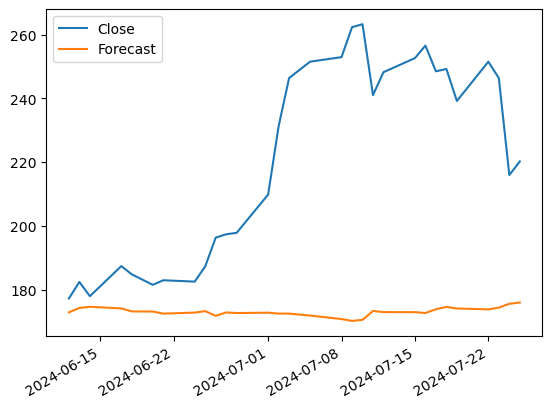

In [75]:

def evaluate_model_stat(model, X: np.ndarray, y: np.ndarray, feature_scaler: StandardScaler, target_scaler: StandardScaler, forecast_horizon: int,
                    df: pd.DataFrame, feature_columns: List[str]) -> float:
    predictions = []
    last_known_prices = df['Close'].iloc[-len(X):]
    current_features = df[feature_columns].iloc[-len(X):]
    
    predictions=model.predict(X)
    predictions=target_scaler.inverse_transform(predictions.reshape(-1, 1)).ravel()
    
    y_true = target_scaler.inverse_transform(y[:forecast_horizon].reshape(-1, 1)).ravel()
    return np.sqrt(mean_squared_error(y_true, predictions))

def find_best_parameters_stat(df: pd.DataFrame, feature_columns: List[str], target_column: str, forecast_horizon: int = 30) -> Dict:
    data = prepare_data_for_training(df, target_column, feature_columns)
    
    param_grid = {
        'n_estimators': [200],
        'learning_rate': [0.01,  0.05],
        'max_depth': [ 3,5],
        'num_leaves': [7,31],
        'min_child_samples': [20, 50]
    }
    
    tscv = TimeSeriesSplit(n_splits=10, test_size=forecast_horizon)
    
    best_score = float('inf')
    best_params = None
    
    for params in product(*param_grid.values()):
        current_params = dict(zip(param_grid.keys(), params))
        model = LGBMRegressor(**current_params, random_state=42, verbosity=-1)
        
        scores = []
        for train_index, test_index in tscv.split(data):
            train_data = data.iloc[train_index]
            test_data = data.iloc[test_index]
            
            if len(train_data) < 90:  # Ensure at least 90 days of training data
                continue
            
            X_train, y_train, X_test, y_test, feature_scaler, target_scaler = scale_data(
                train_data, test_data, feature_columns, 'target')
            
            #model.fit(X_train, y_train)
            model.fit(
            X_train, y_train,
            eval_set=[(X_test, y_test)],
            callbacks=[early_stopping(stopping_rounds=10)]
        )
            score = evaluate_model_stat(model, X_test, y_test, feature_scaler, target_scaler, forecast_horizon, df.iloc[train_index], feature_columns)
            scores.append(score)
        
        avg_score = np.mean(scores)
        if avg_score < best_score:
            best_score = avg_score
            best_params = current_params
        
        print(f"Params: {current_params}, Average RMSE: {avg_score}")
    
    print(f"\nBest parameters: {best_params}")
    print(f"Best average RMSE: {best_score}")
    return best_params

#Create models with new features
## Create several LightGBM models for each future day to forecast
forecast_horizon=30
# Prepare the data
train_data= df_with_features_extra.iloc[:-forecast_horizon]
test_data = df_with_features_extra.iloc[-forecast_horizon:]

feature_scaler = StandardScaler()
target_scaler = StandardScaler()
#feature_columns_extrafeature_columns = [col for col in df_with_features_extra.columns if col not in ['Close', 'target']]
target_column='Close'
train_features_scaled = feature_scaler.fit_transform(train_data[feature_columns_extra])
train_target_scaled = target_scaler.fit_transform(train_data[[target_column]])

pred_models={}
for i in range(forecast_horizon):
        df_with_features_mod = train_data.copy()
        df_with_features_mod['target'] = df_with_features_mod['Close'].shift(-i)  # Shift by a forecasted day
        df_with_features_mod=df_with_features_mod.dropna()
        train_features_scaled_mod = feature_scaler.transform(df_with_features_mod[feature_columns_extra])
        train_target_scaled_mod = target_scaler.transform(df_with_features_mod[[target_column]])
        best_params = find_best_parameters_stat(df_with_features_mod, feature_columns_extra, 'Close', forecast_horizon=1)
    
        # Create and train the model
        model = LGBMRegressor(**best_params, random_state=42, verbosity=-1)
        model.fit(train_features_scaled_mod, train_target_scaled_mod)
        pred_models[f'model_{i}']=model
last_train_day_features=train_data[feature_columns_extra].iloc[-1]

model_test_predictions=[]
for i in range(forecast_horizon):
        model=pred_models[f'model_{i}']
        last_train_day_features_scaled = feature_scaler.transform(last_train_day_features.to_frame().T)
        pred_scaled = model.predict(last_train_day_features_scaled)
        pred = target_scaler.inverse_transform(pred_scaled.reshape(-1, 1))[0][0]
        model_test_predictions.append(pred)
        print(f"Forecast for day {i+1}: {pred}")
        #last_train_day_features=update_features(last_train_day_features.to_frame(), pred)
#predictions=model.predict(X_test)
#predictions=target_scaler.inverse_transform(predictions.reshape(-1, 1)).ravel()
test_data['Forecast']=model_test_predictions
test_data[['Close', 'Forecast']].plot()
#test_data['Close'].plot(label='Actual')
#plt.plot(test_data.index, model_test_predictions, label='Forecast')
plt.legend()
plt.show()

In [76]:
#calculate the RMSE, MAPE, MAE between the actual and forecasted values
from sklearn.metrics import mean_squared_error, mean_absolute_error
def calculate_metrics(y_true, y_pred):
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    mae = mean_absolute_error(y_true, y_pred)
    return rmse, mape, mae

rmse, mape, mae = calculate_metrics(test_data['Close'], test_data['Forecast'])
print(f"RMSE: {rmse}")
print(f"MAPE: {mape:.2f}%")
print(f"MAE: {mae}")


RMSE: 56.81970399420571
MAPE: 19.96%
MAE: 47.60040188770752


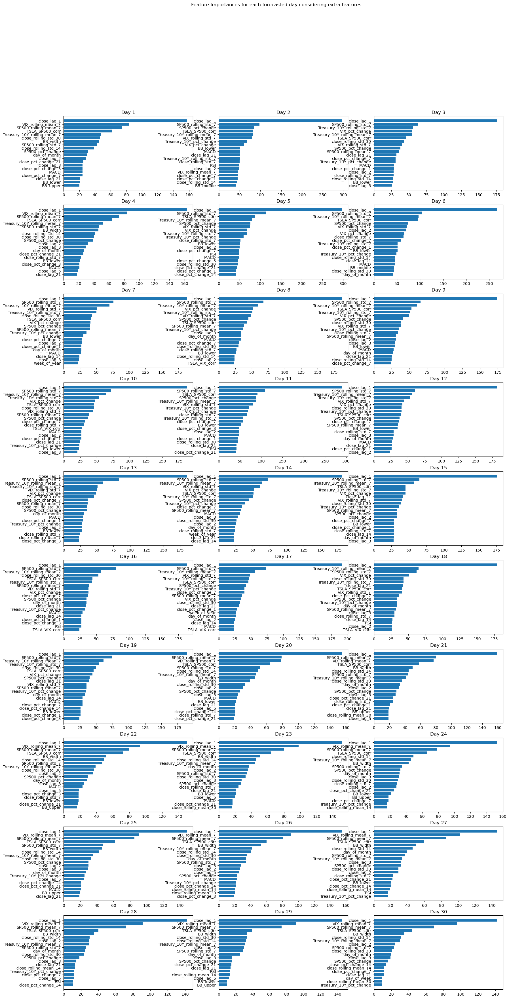

In [77]:
#df_with_features_mod[feature_columns_extra]

#Plotting the feature importances for all the models in pred_models in 
# grid
fig, axs = plt.subplots(10, 3, figsize=(20, 40))

axs = axs.ravel()
for i in range(len(pred_models)):
    model=pred_models[f'model_{i}']
    top_features = get_feature_importance(model, feature_columns_extra)
    axs[i].barh(top_features['feature'], top_features['importance'])
    axs[i].set_title(f"Day {i+1}")
    axs[i].invert_yaxis()
fig.suptitle('Feature Importances for each forecasted day considering extra features')
plt.show()